## Trigger Word Detection

- Nhận dạng trigger word như "hey siri", "ok google". Ở đây ví dụ nhận dạng khi mình nói "activate".
- Nhấn vào từng ô, xong shift enter để chạy từ trên xuống dưới

<a name='0'></a>
## Packages

In [1]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
import IPython
from td_utils import *
from functions import *
%matplotlib inline
%reload_ext autoreload
%autoreload 2

Ví dụ

In [2]:
IPython.display.Audio("./raw_data/activates/1.wav")

<a name='1-2'></a>
### 1.2 - Từ Audio đến Spectrograms

Audio là gì?
What really is an audio recording? 
* Một micrô ghi lại những thay đổi nhỏ của áp suất không khí theo thời gian và chính những thay đổi nhỏ về áp suất không khí này mà tai của bạn cũng cảm nhận như là âm thanh.
* Bạn có thể coi bản ghi âm như một danh sách dài các con số đo những thay đổi nhỏ về áp suất không khí được phát hiện bởi micrô.


#### Spectrogram
* Khá khó để tìm ra từ biểu diễn âm thanh "thô" này liệu từ "activate" có được nói hay không.
* Để giúp mô hình trình tự của bạn dễ dàng học cách phát hiện các từ kích hoạt hơn, chúng tôi sẽ tính toán * quang phổ * của âm thanh.
* Biểu đồ quang phổ cho chúng ta biết có bao nhiêu tần số khác nhau hiện diện trong một đoạn âm thanh tại bất kỳ thời điểm nào.

Hãy xem ví dụ về biể đồ âm thanh và biểu đồ tần số tương ứng, để ý sự giống nhau giữa hai lần nói "activate" trong cả hai biểu đồ

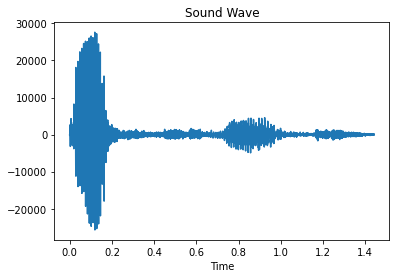

In [3]:
path = "raw_data/activates/1.wav"
visualize(path)
IPython.display.Audio(path)

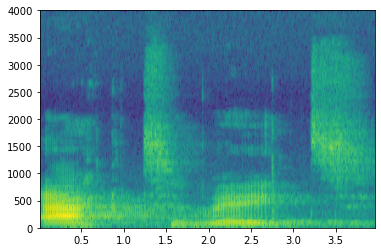

In [4]:
graph = graph_spectrogram(path)

Biểu đồ trên biểu thị mức độ hoạt động của mỗi tần số (trục y) trên một số bước thời gian (trục x).


* Màu sắc trong biểu đồ tần số cho biết mức độ xuất hiện của các tần số khác nhau trong âm thanh tại các thời điểm khác nhau.
* Màu vàng và xanh lá cây có nghĩa là một tần số nhất định hoạt động nhiều hơn hoặc xuất hiện nhiều hơn trong clip âm thanh.
* Màu xanh lam biểu thị tần số hoạt động ít hơn.

Có thể nhìn thấy khi "activate" được nói trên tần số và biểu đồ âm thanh. Tuy nhiên biểu đồ tần số số mang nhiều dữ liệu hơn và dễ cho máy học để phân biệt "activate" và những từ khác.

<a name='1-3'></a>
### Tạo dữ liệu

Chèn giọng đọc "activate" và những những từ khác ở những thời điểm ngẫu nhiên trên nền tiếng ồn để tạo thành tập dữ liệu cho huấn luyện 

Ví dụng minh họa:
* Chúng tôi đã chèn "activate", "inocence", "activate", "baby."
* Đánh dấu "1" sau khi "activate" được nói và "0" cho phần còn lại.


<img src="images/label_diagram.png" style="width:500px;height:200px;">


Bên dưới là kết quả sau khi đã chèn âm thanh đọc "activate" và những từ khác trên nền tiếng ồn và biểu đồ tần số tương ứng.

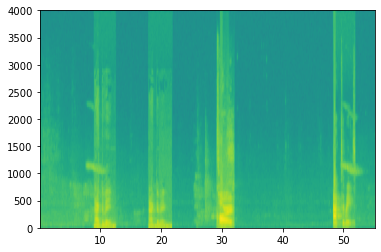

In [5]:
# Load audio segments using pydub 
Tx = 5511 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram
Ty = 1375 # The number of time steps in the output of our model

np.random.seed(20)
activates, negatives, backgrounds = load_raw_audio('./raw_data/')
x, y = create_training_example(backgrounds[1], activates, negatives, Ty)
IPython.display.Audio("train.wav")

### Dãy đánh dấu
 * Chúng ta dán nhãn thủ công "1" sau mỗi khi "activate" được nói, và 0 cho phần còn lại
 * Nhãn dán sẽ là căn cứ để mô hình AI biết "activate" được nói lúc nào
 * Mục tiêu của quá trình huấn luyện mô hình AI để nó có thể tự động dán nhãn cho thu âm bất kỳ

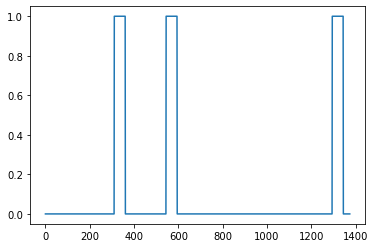

In [6]:
plt.plot(y[0])

### 1.4 - Bộ đào tạo đầy đủ
* Như vậy chúng ta cần hai thứ để tạo bộ dữ liệu: Biểu đồ tần số và Nhãn dán
* Như trên là 1 mẫu dữ liệu gồm khoảng 10s âm thanh
* chúng ta sẽ cần khoảng 10000 mẫu dữ liệu như thế cho máy tính học. Ví dụ dưới đây sẽ tạo 32 mẫu và in biểu đồ tần số mẫu cuối cùng.

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31


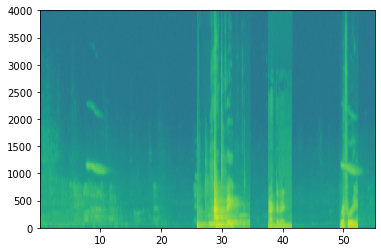

In [15]:
# Load preprocessed dev set examples
np.random.seed(4543)
nsamples = 32
X = []
Y = []
for i in range(0, nsamples):
    print(i)
    x, y = create_training_example(backgrounds[i % 2], activates, negatives, Ty)
    X.append(x.swapaxes(0,1))
    Y.append(y.swapaxes(0,1))
X = np.array(X)
Y = np.array(Y)

<a name='2'></a>
## 2 - Mô hình AI

* Mô hình (model) được xem là bộ não của con AI, nó chứa những nhận thức (weights) mà AI tích cóp được lúc huấn luyện trên tập dữ liệu âm thanh ở trên.
* Mỗi lần chạy mô hình AI sẽ có đầu vào là biểu đồ tầng số như trên, nó có nhiệm vụ đánh dấu vị trí từ "activate" được nói 
* Dựa dãy đánh dấu đúng mà chúng ta đã tạo ra, sai số sẽ được cập nhật để lần chạy sau tốt hơn

Mô hình AI sẽ có nhiều tầng, mỗi tầng làm 1 nhiệm vụ riêng. Đầu ra của tầng này sẽ là đầu vào của tầng kế tiếp. Sau đây là mô hình dành cho bài toán nhận dạng âm thanh, gồm 3 tầng chính
* Convolution layer xử lý hình ảnh/biểu đồ tầng số thành 5511 tín hiệu.
* GRU layer (gated recurent unit) xử lý chuỗi - từng tín hiệu sau quá trình xử lý ảnh sẽ được đưa vào theo thứ tự từ trái qua phải. Ở đây mình dùng 2 lớp GRU chồng lên nhau. 
* Lớp cuối cùng Sigmoid sẽ cho ra "0" hoặc "1" dựa trên việc đoạn tín hiệu trước đó có chứa âm thanh "activate" hay không
<img src="images/model.png" style="width:600px;height:600px;">

### 2.1 Việc huấn luyện model tốn nhiều thời gian với số lượng dữ liệu lớn. 
Ở đây mình chỉ dùng mô hình đã có sẵn và cho huấn luyện thêm trên 32 mẫu đã được tạo để tiết kiệm thời gian.

In [19]:
from tensorflow.keras.models import model_from_json
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from tensorflow.keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam

json_file = open('./models/model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
model.load_weights('./models/model.h5')
# model = modelf(input_shape = (Tx, n_freq))
model.summary()
model.layers[2].trainable = False
model.layers[7].trainable = False
model.layers[10].trainable = False

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 5511, 101)]       0         
_________________________________________________________________
conv1d (Conv1D)              (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization (BatchNo (None, 1375, 196)         784       
_________________________________________________________________
activation (Activation)      (None, 1375, 196)         0         
_________________________________________________________________
dropout (Dropout)            (None, 1375, 196)         0         
_________________________________________________________________
gru (GRU)                    (None, 1375, 128)         125184    
_________________________________________________________________
dropout_1 (Dropout)          (None, 1375, 128)         0     

In [21]:
opt = Adam(learning_rate=1e-6, beta_1=0.9, beta_2=0.999)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])
model.fit(X, Y, batch_size = 16, epochs=1)

2/2 [==============================] - 6s 1s/step - loss: 0.1895 - accuracy: 0.9375


#### Chạy thử
Khi chạy thực tế, mô hình AI sẽ cho ra kết quả là nhãn dán 0 và 1. Ở những nơi có nhãn "1", ta sẽ thêm âm thanh chime vào để biết mô hình đã nhận biết được từ "activate"

In [71]:
your_filename = "audio_examples\chime_output.wav"
IPython.display.Audio(your_filename)

## 3 - Chạy thử
Phần dưới đây sẽ thu âm giọng của bạn trong vòng 10s, hãy nói vài lần "activate" và những từ khác


In [67]:
import pyaudio
import wave

chunk = 1024  # Record in chunks of 1024 samples
sample_format = pyaudio.paInt16  # 16 bits per sample
channels = 2
fs = 44100  # Record at 44100 samples per second
seconds = 10
filename = "input.wav"

p = pyaudio.PyAudio()  # Create an interface to PortAudio

print('Recording')

stream = p.open(format=sample_format,
                channels=channels,
                rate=fs,
                frames_per_buffer=chunk,
                input=True)

frames = []  # Initialize array to store frames

# Store data in chunks for 3 seconds
for i in range(0, int(fs / chunk * seconds)):
    data = stream.read(chunk)
    frames.append(data)

# Stop and close the stream 
stream.stop_stream()
stream.close()
# Terminate the PortAudio interface
p.terminate()

print('Finished recording')

# Save the recorded data as a WAV file
wf = wave.open(filename, 'wb')
wf.setnchannels(channels)
wf.setsampwidth(p.get_sample_size(sample_format))
wf.setframerate(fs)
wf.writeframes(b''.join(frames))
wf.close()

Recording
Finished recording


### Nghe lại bản thu âm, và chạy ra kết quả

In [68]:
your_filename = "input.wav"
preprocess_audio(your_filename)
IPython.display.Audio(your_filename) # listen to the audio you uploaded 

C:\Users\ASUS\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:7558: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


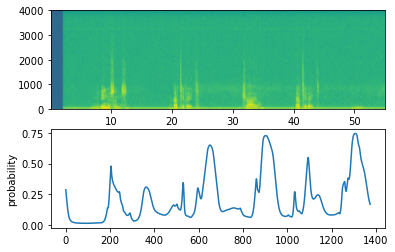

In [70]:
your_filename = "input.wav"

chime_threshold = 0.6
preprocess_audio(your_filename)

prediction = detect_triggerword(your_filename)
chime_on_activate(your_filename, prediction, chime_threshold)
IPython.display.Audio("./chime_output.wav")